In [1]:
# Data Managing
import pandas as pd
import numpy as np
import sys
import math
from operator import itemgetter
import time

#Visualisation
import matplotlib.pyplot as plt
import folium
import seaborn as sns
import geopandas as gpd
#import vaex
# Dataset
import pandas_profiling  ## Report information on the dataset 
airbnb = pd.read_csv('AB_NYC_2019.csv')
print(airbnb.shape)
airbnb.head()

(48895, 16)


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [2]:
airbnb.profile_report()

In [2]:
# Airbnb columns
airbnb.columns
airbnb.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [3]:
# Remove some Feature that may not be useful
# id,name, host_id, host_name , latitude, longitude
airbnb_1 = airbnb[['neighbourhood_group',
       'neighbourhood', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365']]
airbnb_1.head()
print(airbnb_1.shape)

(48895, 9)


In [4]:
## Missing value  
airbnb_1.isnull().sum()
#airbnb_1.isnull().sum().sum() # 20141 missing data points

neighbourhood_group                   0
neighbourhood                         0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [5]:
airbnb_1.describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [6]:
airbnb_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 9 columns):
neighbourhood_group               48895 non-null object
neighbourhood                     48895 non-null object
room_type                         48895 non-null object
price                             48895 non-null int64
minimum_nights                    48895 non-null int64
number_of_reviews                 48895 non-null int64
reviews_per_month                 38843 non-null float64
calculated_host_listings_count    48895 non-null int64
availability_365                  48895 non-null int64
dtypes: float64(1), int64(5), object(3)
memory usage: 3.4+ MB


In [7]:
### Pre-Processing 
# Fill missing value with 0
airbnb_1['reviews_per_month'].fillna(0,inplace = True)
airbnb_1.head()

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/generic.py:5434: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Brooklyn,Kensington,Private room,149,1,9,0.21,6,365
1,Manhattan,Midtown,Entire home/apt,225,1,45,0.38,2,355
2,Manhattan,Harlem,Private room,150,3,0,0.00,1,365
3,Brooklyn,Clinton Hill,Entire home/apt,89,1,270,4.64,1,194
4,Manhattan,East Harlem,Entire home/apt,80,10,9,0.10,1,0


In [8]:
airbnb_1.shape

(48895, 9)

In [9]:
## Unique Neighbor
print(airbnb_1.neighbourhood.nunique())
print(airbnb_1.neighbourhood.unique())

221
['Kensington' 'Midtown' 'Harlem' 'Clinton Hill' 'East Harlem'
 'Murray Hill' 'Bedford-Stuyvesant' "Hell's Kitchen" 'Upper West Side'
 'Chinatown' 'South Slope' 'West Village' 'Williamsburg' 'Fort Greene'
 'Chelsea' 'Crown Heights' 'Park Slope' 'Windsor Terrace' 'Inwood'
 'East Village' 'Greenpoint' 'Bushwick' 'Flatbush' 'Lower East Side'
 'Prospect-Lefferts Gardens' 'Long Island City' 'Kips Bay' 'SoHo'
 'Upper East Side' 'Prospect Heights' 'Washington Heights' 'Woodside'
 'Brooklyn Heights' 'Carroll Gardens' 'Gowanus' 'Flatlands' 'Cobble Hill'
 'Flushing' 'Boerum Hill' 'Sunnyside' 'DUMBO' 'St. George' 'Highbridge'
 'Financial District' 'Ridgewood' 'Morningside Heights' 'Jamaica'
 'Middle Village' 'NoHo' 'Ditmars Steinway' 'Flatiron District'
 'Roosevelt Island' 'Greenwich Village' 'Little Italy' 'East Flatbush'
 'Tompkinsville' 'Astoria' 'Clason Point' 'Eastchester' 'Kingsbridge'
 'Two Bridges' 'Queens Village' 'Rockaway Beach' 'Forest Hills' 'Nolita'
 'Woodlawn' 'University Height

In [10]:
airbnb_1.columns

Index(['neighbourhood_group', 'neighbourhood', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

In [11]:
airbnb_1.describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,152.720687,7.029962,23.274466,1.090910,7.143982,112.781327
std,240.154170,20.510550,44.550582,1.597283,32.952519,131.622289
min,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,69.000000,1.000000,1.000000,0.040000,1.000000,0.000000
50%,106.000000,3.000000,5.000000,0.370000,1.000000,45.000000
75%,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000
max,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


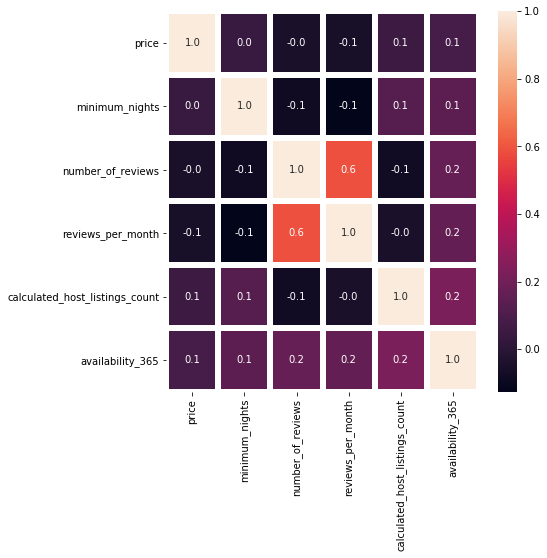

In [12]:
## Corr plot to see the correlation throughout feature.
## The dataset with the selected feature barely related to each other.
## As you can see from the correlation that are around 0.1 or -.1
f,ax=plt.subplots(figsize=(7,7))
sns.heatmap(airbnb_1.corr(),annot=True,linewidths=5,fmt='.1f',ax=ax)
plt.show()

#### Visualisation

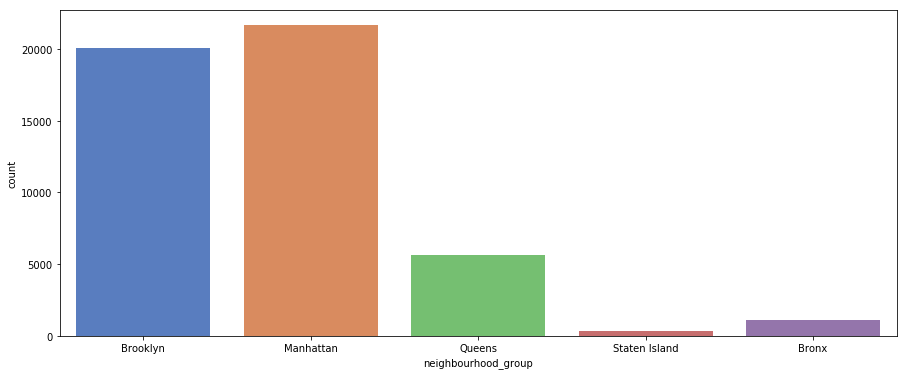

In [13]:
## Count Neighboorhood group
f,ax = plt.subplots(figsize=(15,6))
ax = sns.countplot(airbnb_1.neighbourhood_group,palette="muted")
plt.show()

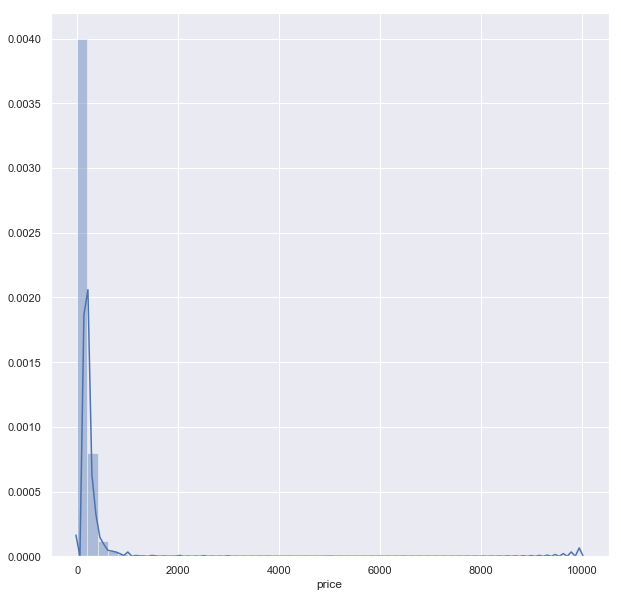

In [14]:
## Histrogram for Price
sns.set(color_codes = True)
fig,ax = plt.subplots(1,1, figsize=(10,10))
ax = sns.distplot(airbnb_1.price)

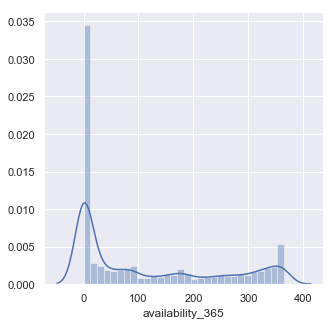

In [15]:
# Histogram for availability_365 
fig,ax = plt.subplots(1,1, figsize=(5,5))
ax = sns.distplot(airbnb_1.availability_365)


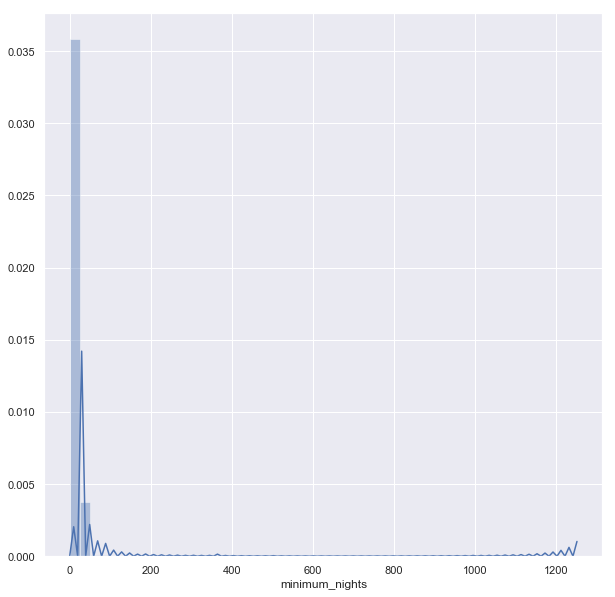

In [16]:
fig,ax = plt.subplots(1,1, figsize=(10,10))
ax = sns.distplot(airbnb_1.minimum_nights)

In [17]:
airbnb_1.columns

Index(['neighbourhood_group', 'neighbourhood', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

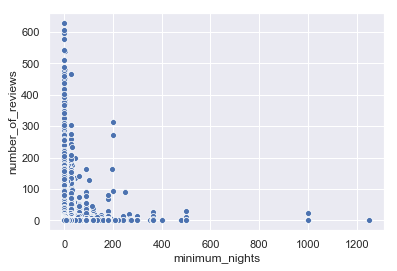

In [18]:
ax = sns.scatterplot(x="minimum_nights", y="number_of_reviews", data=airbnb_1)

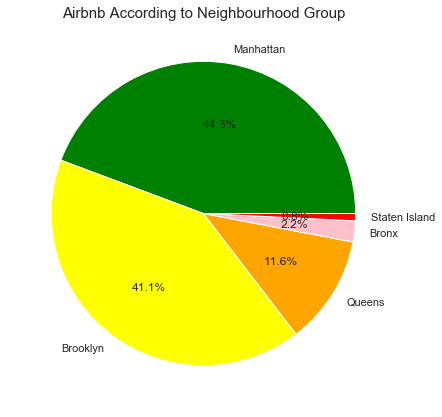

In [19]:
## Pie chart for Neighbourhood_group
labels = airbnb_1.neighbourhood_group.value_counts().index
colors = ['green','yellow','orange','pink','red']
explode = [0,0,0,0,0]
sizes = airbnb_1.neighbourhood_group.value_counts().values

plt.figure(0,figsize = (7,7))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Airbnb According to Neighbourhood Group',fontsize = 15)
plt.show()

## Most of the distribution goes to Manhattan and Brooklyn

In [20]:
#Get a count by neighbour
count = airbnb.groupby('neighbourhood_group').agg('count').reset_index()
count.head()

,neighbourhood_group,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,Bronx,1091,1090,1091,1090,1091,1091,1091,1091,1091,1091,1091,876,876,1091,1091
1,Brooklyn,20104,20098,20104,20095,20104,20104,20104,20104,20104,20104,20104,16447,16447,20104,20104
2,Manhattan,21661,21652,21661,21652,21661,21661,21661,21661,21661,21661,21661,16632,16632,21661,21661
3,Queens,5666,5666,5666,5664,5666,5666,5666,5666,5666,5666,5666,4574,4574,5666,5666
4,Staten Island,373,373,373,373,373,373,373,373,373,373,373,314,314,373,373


In [21]:
# Use Geopandas import Newyork base mape
nyc = gpd.read_file(gpd.datasets.get_path('nybb'))
nyc.head(5)

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,(POLYGON ((970217.0223999023 145643.3322143555...
1,4,Queens,896344.047763,3.045213e+09,(POLYGON ((1029606.076599121 156073.8142089844...
2,3,Brooklyn,741080.523166,1.937479e+09,(POLYGON ((1021176.479003906 151374.7969970703...
3,1,Manhattan,359299.096471,6.364715e+08,(POLYGON ((981219.0557861328 188655.3157958984...
4,2,Bronx,464392.991824,1.186925e+09,(POLYGON ((1012821.805786133 229228.2645874023...


In [22]:
nyc = nyc.rename(columns = {'BoroName':'neighbourhood_group'})
nyc

,BoroCode,neighbourhood_group,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,(POLYGON ((970217.0223999023 145643.3322143555...
1,4,Queens,896344.047763,3.045213e+09,(POLYGON ((1029606.076599121 156073.8142089844...
2,3,Brooklyn,741080.523166,1.937479e+09,(POLYGON ((1021176.479003906 151374.7969970703...
3,1,Manhattan,359299.096471,6.364715e+08,(POLYGON ((981219.0557861328 188655.3157958984...
4,2,Bronx,464392.991824,1.186925e+09,(POLYGON ((1012821.805786133 229228.2645874023...


In [23]:
nyc_geo = nyc.merge(count, on='neighbourhood_group')
nyc_geo.head()

,BoroCode,neighbourhood_group,Shape_Leng,Shape_Area,geometry,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,5,Staten Island,330470.010332,1.623820e+09,(POLYGON ((970217.0223999023 145643.3322143555...,373,373,373,373,373,373,373,373,373,373,373,314,314,373,373
1,4,Queens,896344.047763,3.045213e+09,(POLYGON ((1029606.076599121 156073.8142089844...,5666,5666,5666,5664,5666,5666,5666,5666,5666,5666,5666,4574,4574,5666,5666
2,3,Brooklyn,741080.523166,1.937479e+09,(POLYGON ((1021176.479003906 151374.7969970703...,20104,20098,20104,20095,20104,20104,20104,20104,20104,20104,20104,16447,16447,20104,20104
3,1,Manhattan,359299.096471,6.364715e+08,(POLYGON ((981219.0557861328 188655.3157958984...,21661,21652,21661,21652,21661,21661,21661,21661,21661,21661,21661,16632,16632,21661,21661
4,2,Bronx,464392.991824,1.186925e+09,(POLYGON ((1012821.805786133 229228.2645874023...,1091,1090,1091,1090,1091,1091,1091,1091,1091,1091,1091,876,876,1091,1091


(905464.7390380859, 1075092.8783935546, 112485.76063504723, 280480.4142594267)

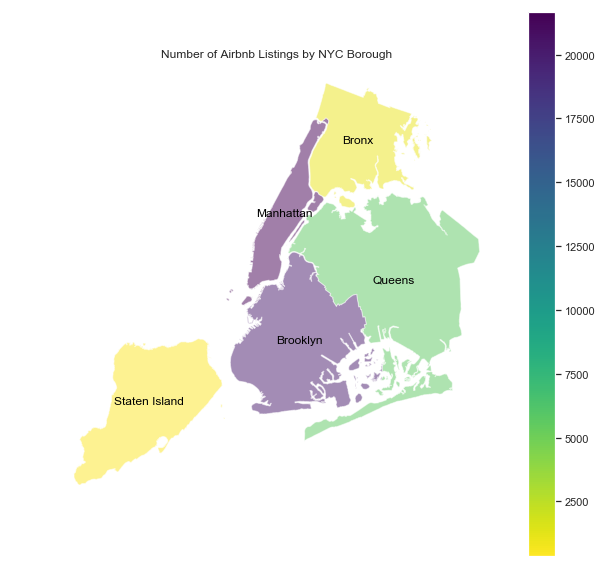

In [24]:
#Plot the count by borough into a map
# It shows the density of people listing their place in each neighbour.
fig,ax = plt.subplots(1,1, figsize=(10,10))
nyc_geo.plot(column='id', cmap='viridis_r', alpha=.5, ax=ax, legend=True)
nyc_geo.apply(lambda x: ax.annotate(s=x.neighbourhood_group, color='black', xy=x.geometry.centroid.coords[0],ha='center'), axis=1)
plt.title("Number of Airbnb Listings by NYC Borough")
plt.axis('off')

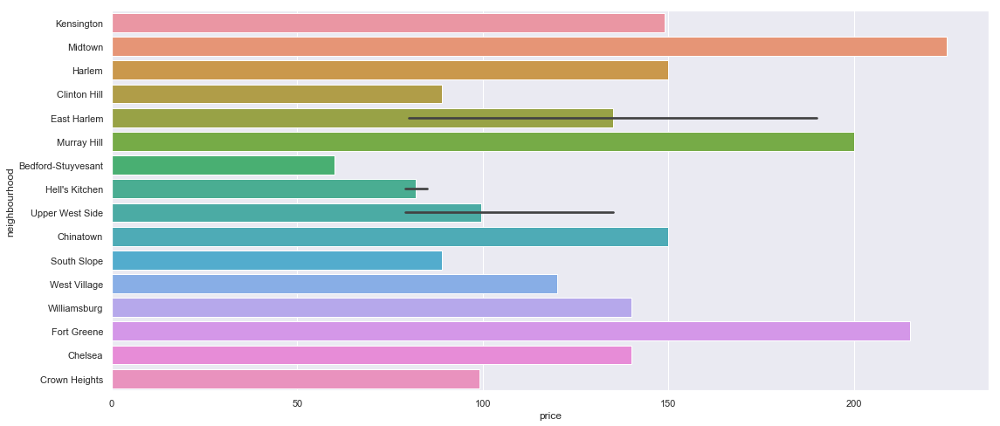

In [25]:
#neighbourhood - price
plt.figure(figsize=(18,8))
sns.barplot(x=airbnb_1.price[:20], y=airbnb_1.neighbourhood[:20]) 
#plt.xticks(rotation=90)
plt.show()

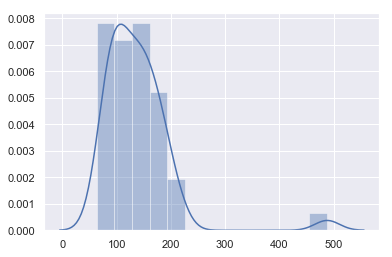

In [26]:
## Price Distribution in Brooklyn and Mahattan
df1 = airbnb_1[airbnb_1.neighbourhood_group == "Brooklyn"][["neighbourhood","price"]]
d = df1.groupby("neighbourhood").mean()
sns.distplot(d)
plt.show()

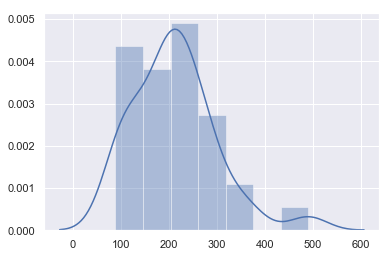

In [27]:
## Price Distribution in Brooklyn and Mahattan
df1 = airbnb_1[airbnb_1.neighbourhood_group == "Manhattan"][["neighbourhood","price"]]
d = df1.groupby("neighbourhood").mean()
sns.distplot(d)
plt.show()

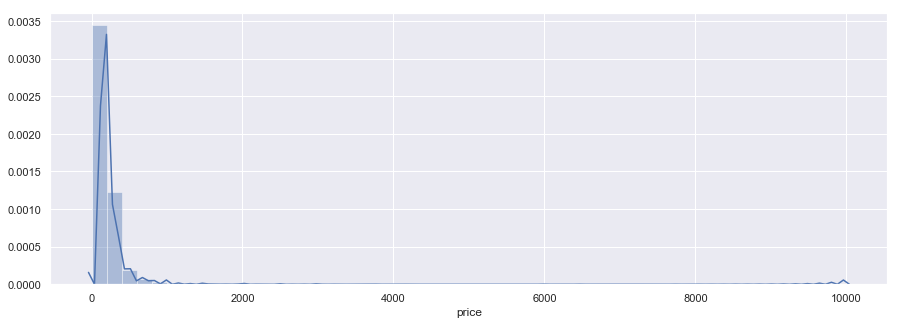

In [28]:
# Manhattan
f,ax = plt.subplots(figsize=(15,5))
df1 = airbnb_1[airbnb_1.neighbourhood_group=="Manhattan"]['price']
sns.distplot(df1)
plt.show()

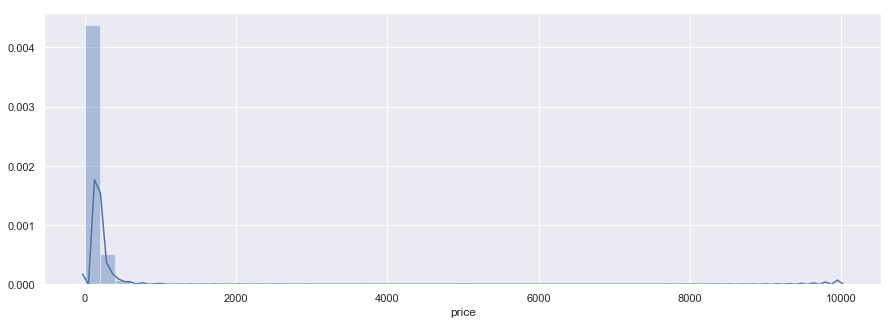

In [29]:
# Brooklyn
f,ax = plt.subplots(figsize=(15,5))
df1 = airbnb_1[airbnb_1.neighbourhood_group=="Brooklyn"]['price']
sns.distplot(df1)
plt.show()

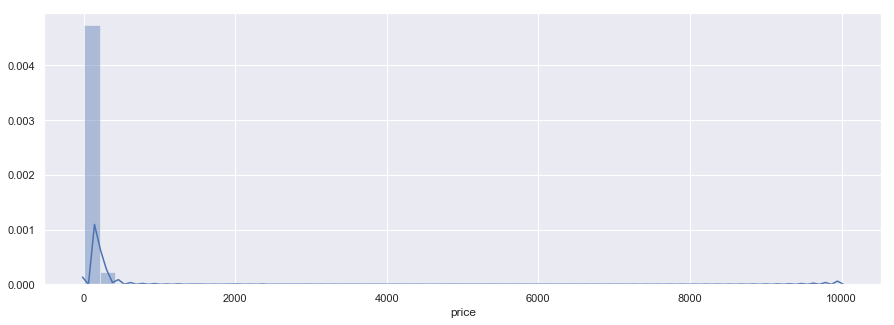

In [30]:
# Queens
f,ax = plt.subplots(figsize=(15,5))
df1 = airbnb_1[airbnb_1.neighbourhood_group=="Queens"]['price']
sns.distplot(df1)
plt.show()

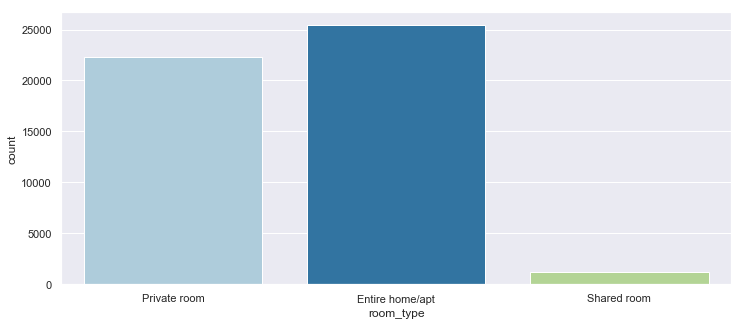

In [31]:
# Count of each type of room
f,ax = plt.subplots(figsize=(12,5))
ax = sns.countplot(airbnb_1.room_type,palette='Paired')
plt.show()
# High Number of private room and Apartment for airbnb bussiness in Newyork

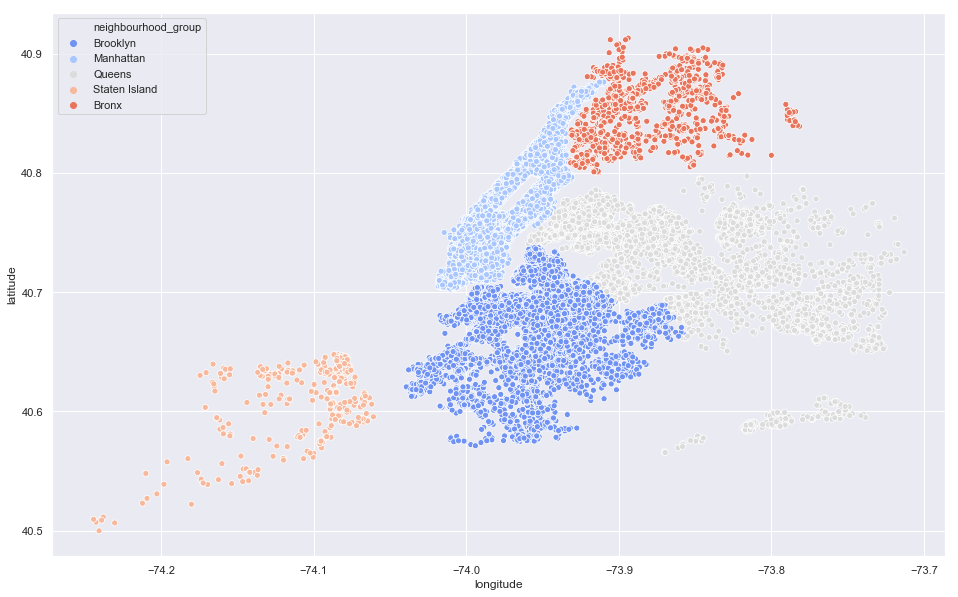

In [32]:
# lat and lon on neighbourhood_group
f,ax = plt.subplots(figsize=(16,10))
ax = sns.scatterplot(y=airbnb.latitude,x=airbnb.longitude,hue=airbnb.neighbourhood_group,palette="coolwarm")
plt.show()

In [33]:
airbnb.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

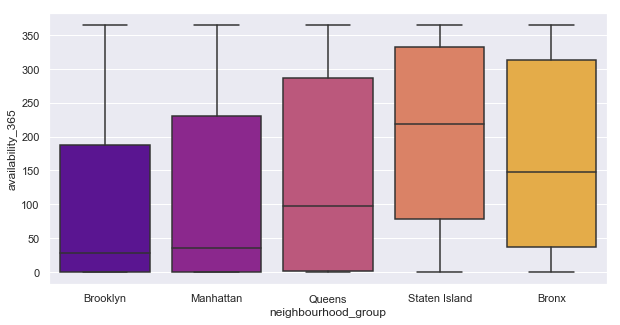

In [34]:
# See relationship between neighbour_group and Availability
plt.figure(figsize=(10,5))
ax = sns.boxplot(data=airbnb_1, x='neighbourhood_group',y='availability_365',palette='plasma')

In [35]:
ava_under_100 = airbnb[airbnb.availability_365 < 100]
ava_under_100.shape

(29733, 16)

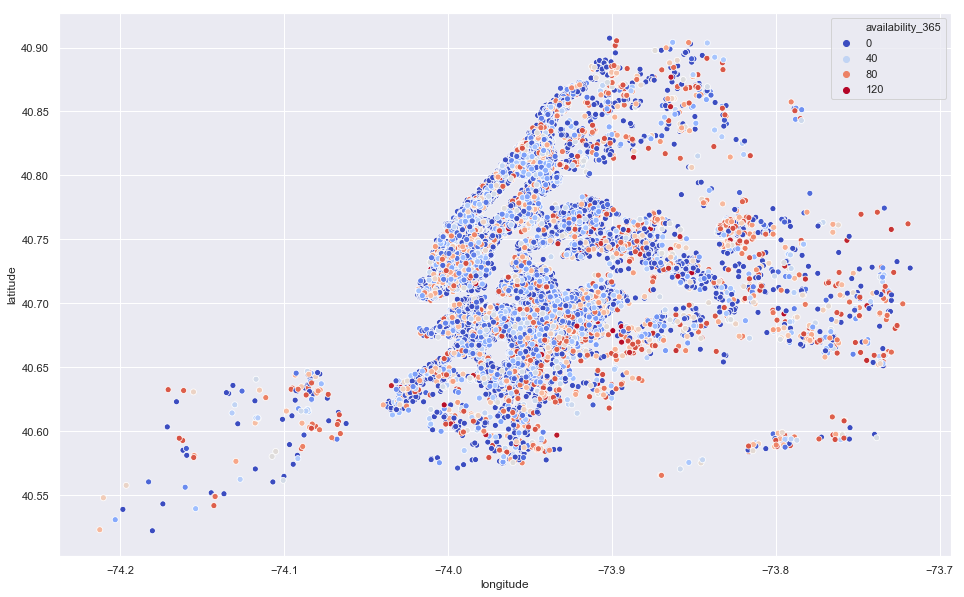

In [36]:
# lat and lon on Availability
f,ax = plt.subplots(figsize=(16,10))
ax = sns.scatterplot(y=ava_under_100.latitude, x=ava_under_100.longitude, hue=ava_under_100.availability_365,palette="coolwarm")
plt.show()

In [37]:
 airbnb_1['room_type'].value_counts()

Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64

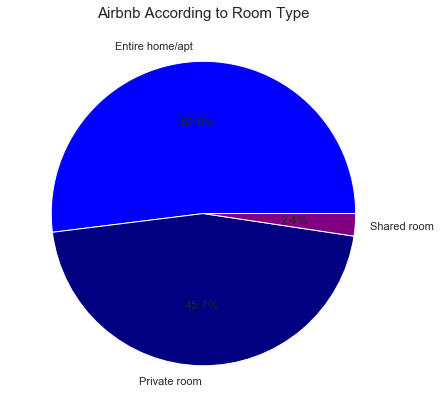

In [38]:
labels = airbnb_1.room_type.value_counts().index
colors = ['blue','navy','purple']
explode = [0,0,0]
sizes = airbnb_1.room_type.value_counts().values

plt.figure(0,figsize = (7,7))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Airbnb According to Room Type',fontsize = 15)
plt.show()

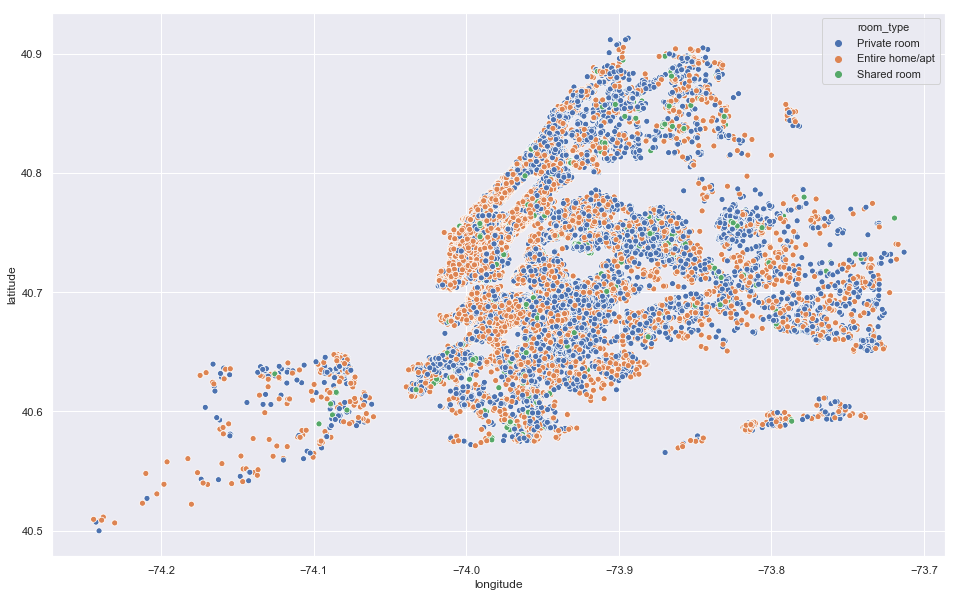

In [39]:
# lat and lon on Room_type
f,ax = plt.subplots(figsize=(16,10))
ax = sns.scatterplot(y=airbnb.latitude,x=airbnb.longitude,hue=airbnb.room_type)
plt.show()

In [40]:
airbnb_1.columns

Index(['neighbourhood_group', 'neighbourhood', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

In [41]:
# Location by review per month
import folium
from folium.plugins import HeatMap
m=folium.Map([40.7128,-74.0060],zoom_start=11)
HeatMap(airbnb[['latitude','longitude','minimum_nights']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)
display(m)

In [42]:
# Calculate host listing count.
import folium
from folium.plugins import HeatMap
m=folium.Map([40.7128,-74.0060],zoom_start=11)
HeatMap(airbnb[['latitude','longitude','calculated_host_listings_count']].dropna(),radius=8,gradient={0.2:'blue',0.4:'yellow',0.6:'orange',1.0:'red'}).add_to(m)
display(m)

In [43]:
airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


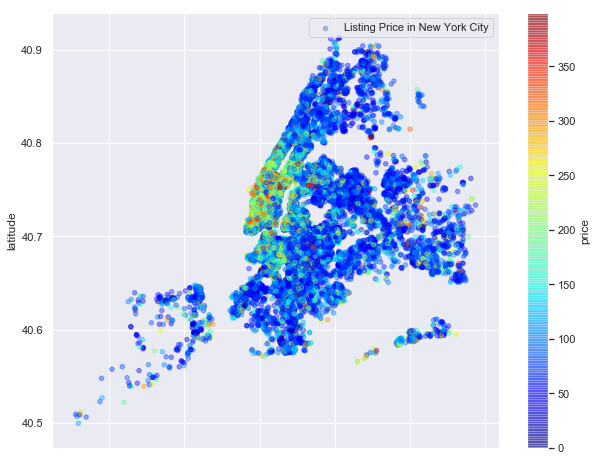

In [44]:
sub = airbnb[airbnb.price <400]
viz_4=sub.plot(kind='scatter', x='longitude', y='latitude', label='Listing Price in New York City', c='price',
                  cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, figsize=(10,8))
viz_4.legend()

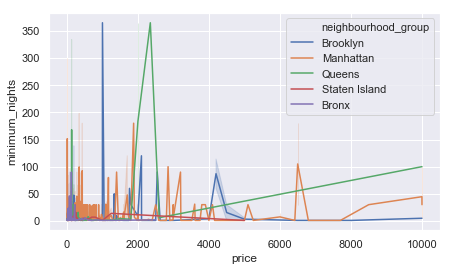

In [45]:
### Add some lineplot
f,ax = plt.subplots(figsize=(7,4))
ax = sns.lineplot(x = 'price', y = 'minimum_nights', hue = 'neighbourhood_group' ,data = airbnb )

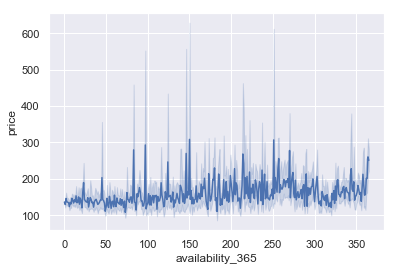

In [46]:
# relation btw availibility 365 and price.
sns.lineplot(x = 'availability_365' , y = 'price', data = airbnb)

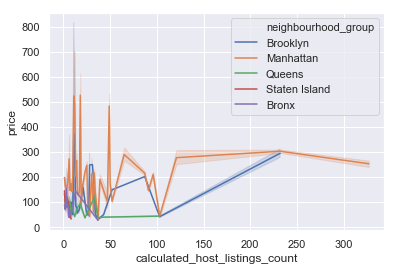

In [47]:
# 
sns.lineplot(x = 'calculated_host_listings_count' , y = 'price',hue = 'neighbourhood_group', data = airbnb )

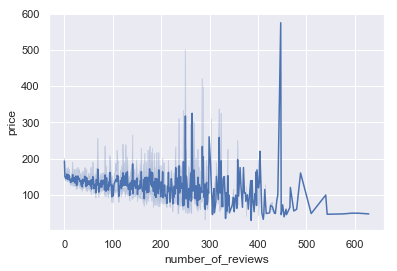

In [48]:
sns.lineplot(x = 'number_of_reviews' , y = 'price', data = airbnb )

In [49]:
airbnb_1.columns

Index(['neighbourhood_group', 'neighbourhood', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

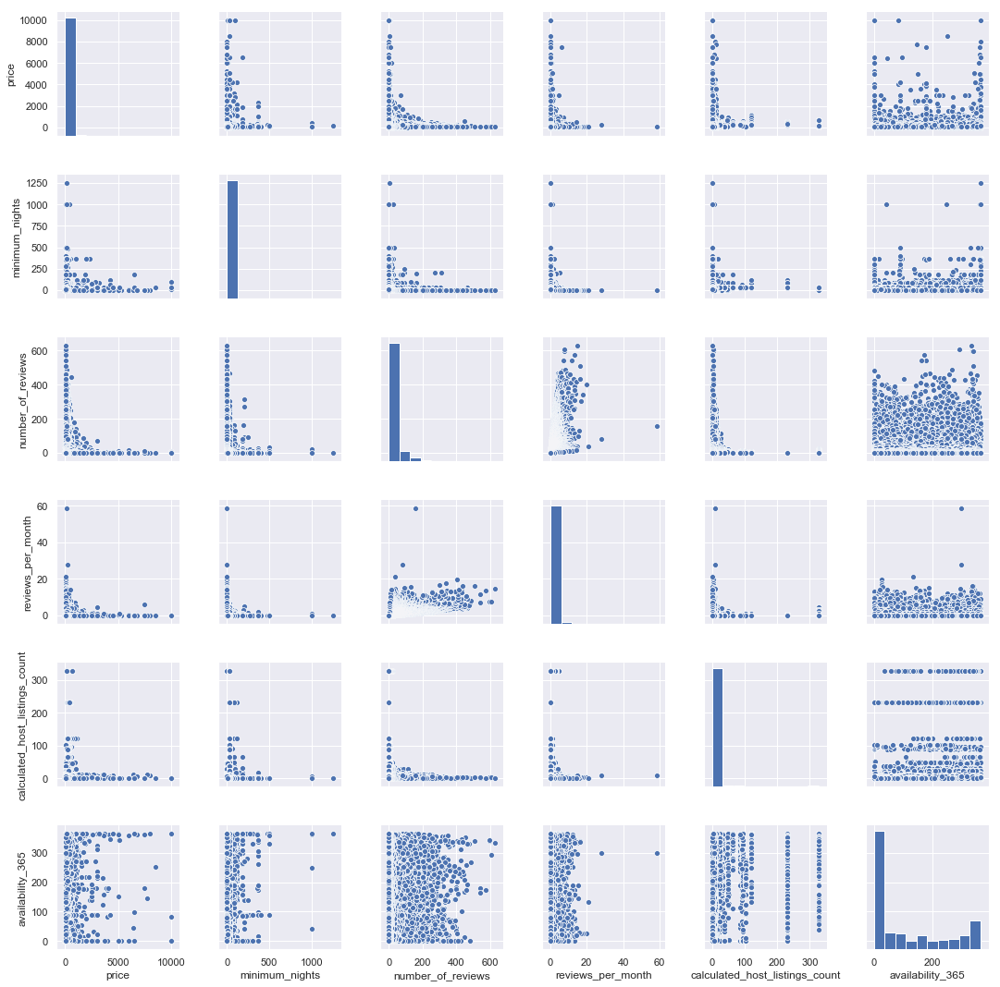

In [50]:
### Try To find pattern 
### Scatter Plot

sns.pairplot(airbnb_1)
plt.show()

In [51]:
### Question for this classification,,,,,,   
### Preprocess data from Airbnb_1 Train,Test,
### Do try to use Decision Tree Classifier and Regression
### Do try to use Random Forest Classifier and Regression
### Maybe Trying XGboosting or any boosting to see the differences.

In [52]:
airbnb_1['neighbourhood_group'].value_counts()

Manhattan        21661
Brooklyn         20104
Queens            5666
Bronx             1091
Staten Island      373
Name: neighbourhood_group, dtype: int64

In [53]:
### Will Use Airbnb_1 for Data analysis and ML classification and Regression
airbnb_1.head()
### Need to drop neighbourhood ,and only use neighbourhood_group.
airbnb_2 = airbnb_1.drop(['neighbourhood','availability_365'],1)
### Replance categorical to number 
#0 to 4 for neighbourhood_group
#0 to 2 for room_type
cat_num = {'neighbourhood_group':{'Entire home/apt': 0,'Private room': 1,'Shared room':2},
           'room_type':{'Manhattan': 0,'Brooklyn':1,'Queens' : 2, 'Bronx':3,'Staten Island':4}}
airbnb_2.replace(cat_num, inplace = True)



### Will use Availability_365 as taget variable.
target_var = airbnb_1['availability_365']
print(airbnb_2.head())
target_var.head()

  neighbourhood_group        room_type  price  minimum_nights  \
0            Brooklyn     Private room    149               1   
1           Manhattan  Entire home/apt    225               1   
2           Manhattan     Private room    150               3   
3            Brooklyn  Entire home/apt     89               1   
4           Manhattan  Entire home/apt     80              10   

   number_of_reviews  reviews_per_month  calculated_host_listings_count  
0                  9               0.21                               6  
1                 45               0.38                               2  
2                  0               0.00                               1  
3                270               4.64                               1  
4                  9               0.10                               1  


0    365
1    355
2    365
3    194
4      0
Name: availability_365, dtype: int64

In [54]:
cat_num = {'room_type':   {'Entire home/apt': 0,'Private room': 1,'Shared room':2},
           'neighbourhood_group':   {'Manhattan': 0,'Brooklyn':1,'Queens' : 2, 'Bronx':3,'Staten Island':4}}

airbnb_2.replace(cat_num, inplace = True)

In [55]:
airbnb_2.columns

Index(['neighbourhood_group', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count'],
      dtype='object')

In [56]:
airbnb_2.shape

(48895, 7)

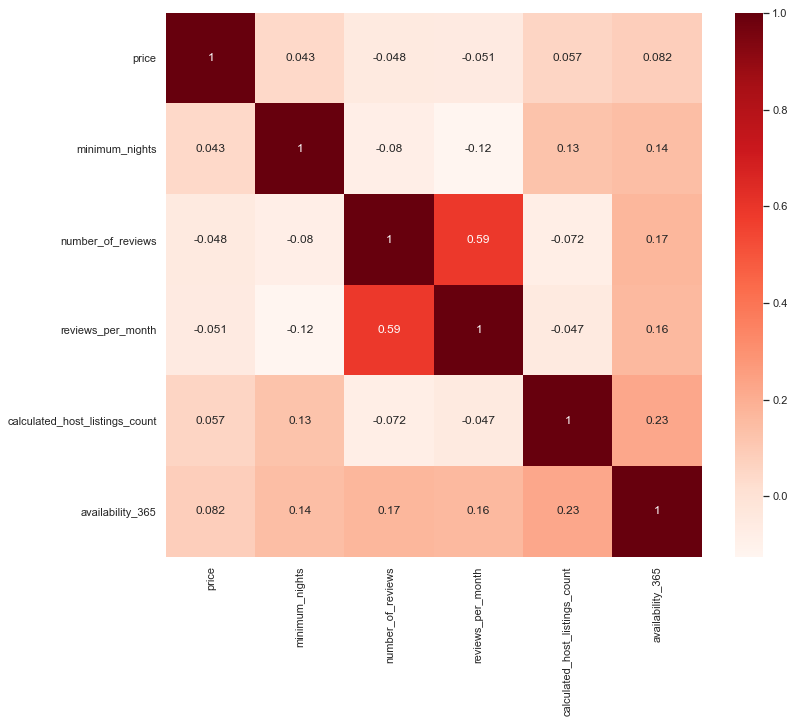

In [57]:
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = airbnb_1.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

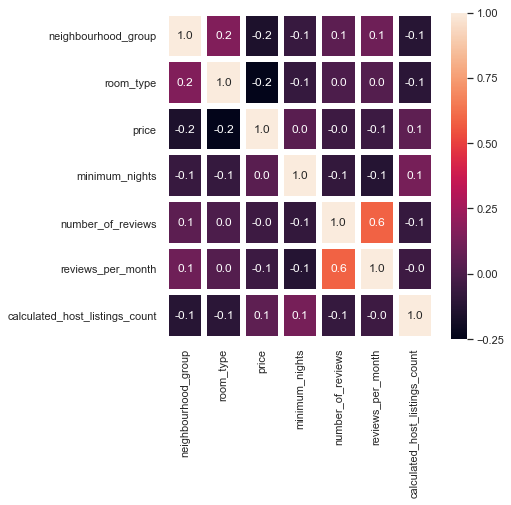

In [58]:
f,ax=plt.subplots(figsize=(6,6))
sns.heatmap(airbnb_2.corr(),annot=True,linewidths=5,fmt='.1f',ax=ax)
plt.show()

In [59]:
## First check with corr if we choose try Filter Method
## As you can see that the correlation is so low
#Correlation with output variable
cor_target = abs(cor["availability_365"])
#Selecting highly correlated features
relevant_features = cor_target[cor_target>0.1]  ## Very less corelation.
relevant_features


minimum_nights                    0.144303
number_of_reviews                 0.172028
reviews_per_month                 0.163732
calculated_host_listings_count    0.225701
availability_365                  1.000000
Name: availability_365, dtype: float64

### Import Module

In [60]:
# Test, Train, Feature_selection , ML
#ML
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor,BaggingRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor , AdaBoostRegressor, GradientBoostingClassifier, AdaBoostClassifier
# Feature Selection
from sklearn.model_selection import train_test_split , cross_validate
from sklearn.feature_selection import RFE, VarianceThreshold, SelectFromModel
from sklearn.feature_selection import SelectKBest, mutual_info_regression, mutual_info_classif, chi2

from sklearn import metrics
from sklearn.externals import joblib
from sklearn.preprocessing import KBinsDiscretizer, scale

#Handle annoying warnings
import warnings, sklearn.exceptions
warnings.filterwarnings("ignore", category=sklearn.exceptions.ConvergenceWarning)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


### Low Variance Filtering

In [61]:
## Low Variance filtering
sel = VarianceThreshold(threshold=0.7)  #Removes any feature with less than 70% variance
fit_mod=sel.fit(airbnb_2)
fitted=sel.transform(airbnb_2)
sel_idx=fit_mod.get_support()
airbnb_2[airbnb_2.columns[sel_idx]].head()

# 6 out of 7 feature have the variance threshold 0.7
len(airbnb_2.columns[sel.get_support()])
## 1 variables has very low variance which is 'room_type'

5

In [62]:
constant_columns = [column for column in airbnb_2.columns
                    if column not in airbnb_2.columns[sel.get_support()]]

print(len(constant_columns))
for column in constant_columns:
    print(column)

2
neighbourhood_group
room_type


In [63]:
'neighbourhood_group'

'neighbourhood_group'

In [64]:
# Use airbnb 3 with the features that has variance above threshold.
airbnb_3 = airbnb_2[[ 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count']]
airbnb_3.head()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count
0,149,1,9,0.21,6
1,225,1,45,0.38,2
2,150,3,0,0.00,1
3,89,1,270,4.64,1
4,80,10,9,0.10,1


### Decision Tree

#### Regressor

In [65]:
## Feature Selection (Wrapper Selection)
## Decision Tree via Decision Tree Regressor
rand_st = 1
rgr = DecisionTreeRegressor(criterion='friedman_mse', splitter='best', max_depth=None, min_samples_split=3, min_samples_leaf=1, max_features=None, random_state=rand_st)
sel_f = SelectFromModel(rgr, prefit=False, threshold='mean', max_features=None)                   

fit_mod=sel_f.fit(airbnb_3, target_var)    
sel_idx=fit_mod.get_support()
# Number of selected Feature
len(airbnb_3.columns[sel_f.get_support()])

3

In [66]:
## Selected feature.
## Wrapper via Decision Tree Regressor
selected_feature = [column for column in airbnb_3.columns
                    if column in airbnb_3.columns[sel_f.get_support()]]

print(len(selected_feature))
#for column in selected_feature:
print('Selected Feature: ', selected_feature)



3
Selected Feature:  ['price', 'reviews_per_month', 'calculated_host_listings_count']


In [67]:
airbnb_sf = airbnb_3[['price', 'reviews_per_month', 'calculated_host_listings_count']]
airbnb_sf.head()

,price,reviews_per_month,calculated_host_listings_count
0,149,0.21,6
1,225,0.38,2
2,150,0.00,1
3,89,4.64,1
4,80,0.10,1


In [68]:
## Train Scikit Learn Model for decision Tree
data_train, data_test, target_train, target_test = train_test_split(airbnb_sf, target_var, test_size=0.2)

In [69]:
## Decision tree Regressor
start_ts=time.time()
rgr = DecisionTreeRegressor(criterion= 'friedman_mse', splitter='best', max_depth=None, min_samples_split=3, min_samples_leaf=1, max_features=None, random_state=rand_st)
rgr.fit(data_train, target_train)

scores_RMSE = math.sqrt(metrics.mean_squared_error(target_test, rgr.predict(data_test)))
print('Decision Tree RMSE:', scores_RMSE)
scores_Expl_Var = metrics.explained_variance_score(target_test, rgr.predict(data_test))
print('Decision Tree Expl Var:', scores_Expl_Var)
print("CV Runtime:", time.time()-start_ts)

Decision Tree RMSE: 140.87894884908732
Decision Tree Expl Var: -0.15300599546294036
CV Runtime: 0.14022421836853027


In [70]:
## Decision tree Regressor with Cross Validation
    #Setup Crossval regression scorers
scorers = {'Neg_MSE': 'neg_mean_squared_error', 'expl_var': 'explained_variance'} 
    
#SciKit Decision Tree Regressor - Cross Val
start_ts=time.time()
rgr = DecisionTreeRegressor(criterion='mse', splitter='best', max_depth=None, min_samples_split=3, min_samples_leaf=1, max_features=None, random_state=rand_st)
scores = cross_validate(rgr, airbnb_sf, target_var, scoring=scorers, cv=10)

scores_RMSE = np.asarray([math.sqrt(-x) for x in scores['test_Neg_MSE']])                                                                        #Turns negative MSE scores into RMSE
scores_Expl_Var = scores['test_expl_var']
print("Decision Tree RMSE:: %0.2f (+/- %0.2f)" % ((scores_RMSE.mean()), (scores_RMSE.std() * 2)))
print("Decision Tree Expl Var: %0.2f (+/- %0.2f)" % ((scores_Expl_Var.mean()), (scores_Expl_Var.std() * 2)))
print("CV Runtime:", time.time()-start_ts)

Decision Tree RMSE:: 144.79 (+/- 21.94)
Decision Tree Expl Var: -0.23 (+/- 0.23)
CV Runtime: 1.2070658206939697


In [71]:
# R2 For Decision tree
rgr = DecisionTreeRegressor(criterion='mse', splitter='best', max_depth=None, min_samples_split=3, min_samples_leaf=1, max_features=None, random_state=rand_st)
rgr.fit(data_train,data_train)
y_predict=rgr.predict(data_test)
from sklearn.metrics import r2_score
r2_score(data_test,y_predict)

0.9780007657203228

In [72]:
airbnb['availability_365'].value_counts()

0      17533
365     1295
364      491
1        408
89       361
5        340
3        306
179      301
90       290
2        270
6        245
363      239
4        233
8        233
342      230
188      225
7        219
88       200
341      199
311      199
9        193
180      192
83       183
358      180
14       173
11       173
12       172
332      171
35       168
362      166
       ...  
203       36
212       36
209       36
226       36
119       35
240       35
200       35
108       35
259       35
223       35
289       34
218       34
187       34
214       33
122       33
111       33
104       33
194       33
114       32
210       32
227       32
206       31
186       31
182       31
143       30
195       26
196       24
183       24
181       23
202       20
Name: availability_365, Length: 366, dtype: int64

#### Classifier

In [73]:
## Feature Selection (Wrapper Selection)
## Decision Tree via Decision Tree Classifier
rand_st = 1
clf = DecisionTreeClassifier(criterion='entropy', splitter='best', max_depth=None, min_samples_split=3, min_samples_leaf=1, max_features=None, random_state=rand_st)
sel_f = SelectFromModel(clf, prefit=False, threshold='mean', max_features=None)                   

fit_mod=sel_f.fit(airbnb_3, target_var)    
sel_idx=fit_mod.get_support()
# Number of selected Feature
len(airbnb_3.columns[sel_f.get_support()])

2

In [74]:
## Selected feature.
## Wrapper via Decision Tree Regressor
selected_feature = [column for column in airbnb_3.columns
                    if column in airbnb_3.columns[sel_f.get_support()]]

print(len(selected_feature))
#for column in selected_feature:
print('Selected Feature: ', selected_feature)


2
Selected Feature:  ['price', 'reviews_per_month']


In [75]:
airbnb_clf = airbnb_3[['price', 'reviews_per_month']]
airbnb_clf.head()

,price,reviews_per_month
0,149,0.21
1,225,0.38
2,150,0.00
3,89,4.64
4,80,0.10


In [76]:
## Train Scikit Learn Model for decision Tree Classifier
data_train, data_test, target_train, target_test = train_test_split(airbnb_clf, target_var, test_size=0.2)

In [77]:
#SciKit Decision Tree - Classifier
## With split dataset because of multiclass and get accuracy
start_ts=time.time()
clf = DecisionTreeClassifier(criterion='entropy', splitter='best', max_depth=None, min_samples_split=3, min_samples_leaf=1, max_features=None, random_state=rand_st)
#scores = cross_validate(clf, airbnb_sf, target_var, scoring=scorers, cv=8)
'''
scores_Acc = scores['test_Accuracy']
print("Decision Tree Acc: %0.2f (+/- %0.2f)" % (scores_Acc.mean(), scores_Acc.std() * 2))                                                                                                    
scores_AUC= scores['test_roc_auc']                                                                     #Only works with binary classes, not multiclass
print("Decision Tree AUC: %0.2f (+/- %0.2f)" % (scores_AUC.mean(), scores_AUC.std() * 2))                           
print("CV Runtime:", time.time()-start_ts)'''
clf.fit(data_train,target_train)
target_predict = clf.predict(data_test)

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

print(accuracy_score(target_test,target_predict))
print(classification_report(target_test, target_predict))


0.294201861130995
              precision    recall  f1-score   support

           0       0.50      0.80      0.62      3564
           1       0.02      0.03      0.02        64
           2       0.00      0.00      0.00        50
           3       0.01      0.02      0.01        65
           4       0.00      0.00      0.00        54
           5       0.01      0.02      0.02        60
           6       0.00      0.00      0.00        47
           7       0.02      0.02      0.02        44
           8       0.00      0.00      0.00        42
           9       0.02      0.03      0.02        33
          10       0.00      0.00      0.00        31
          11       0.00      0.00      0.00        37
          12       0.00      0.00      0.00        35
          13       0.00      0.00      0.00        35
          14       0.00      0.00      0.00        44
          15       0.03      0.03      0.03        34
          16       0.00      0.00      0.00        29
         

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Random Forest

#### Regressor

In [78]:
## Feature Selection (Wrapper Selection)
## Random Forest Regressor
rand_st = 1
rgr = RandomForestRegressor(n_estimators = 100, max_features = .33 , max_depth = None, min_samples_split = 3,criterion = 'mse', random_state = rand_st)   
sel_f1 = SelectFromModel(rgr, prefit=False, threshold='mean', max_features=None)                   
rgr.fit(airbnb_3, target_var)
fit_mod=sel_f1.fit(airbnb_3, target_var)    
sel_idx=fit_mod.get_support()


print(airbnb_3.columns)
print(len(airbnb_3.columns[sel_f1.get_support()]))
print(rgr.feature_importances_)


Index(['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count'],
      dtype='object')
2
[0.2579335  0.14360309 0.16869431 0.23328101 0.1964881 ]


In [79]:
## Selected feature.
## Wrapper via Random Forest Regressor
selected_feature = [column for column in airbnb_3.columns
                    if column in airbnb_3.columns[sel_f1.get_support()]]
selected_feature
#print(len(selected_feature))
#for column in selected_feature:
    #print(column)
    
    

['price', 'reviews_per_month']

In [80]:
## Train Scikit Learn Model
data_train, data_test, target_train, target_test = train_test_split(airbnb_sf, target_var, test_size=0.2)

In [81]:
# Random Forest Regressor (Without Cross-Validation)
# Bagging

start_ts=time.time()
rgr = DecisionTreeRegressor(criterion = 'friedman_mse', splitter = 'best' , max_depth = None, min_samples_leaf = 1 , max_features = None , random_state = rand_st) 
bag = BaggingRegressor(rgr, max_samples = 0.6 , random_state = rand_st )
bag.fit(data_train, target_train) 

scores_RMSE = math.sqrt(metrics.mean_squared_error(target_test, bag.predict(data_test)))
print('Decision Tree RMSE:', scores_RMSE)
scores_Expl_Var = metrics.explained_variance_score(target_test, bag.predict(data_test))
print('Decision Tree Expl Var:', scores_Expl_Var)
print("CV Runtime:", time.time()-start_ts)

Decision Tree RMSE: 120.82105051629918
Decision Tree Expl Var: 0.15338843978198102
CV Runtime: 0.5436420440673828


In [82]:
# Random Forest with cross validation
scorers = {'Neg_MSE': 'neg_mean_squared_error', 'expl_var': 'explained_variance'} 
    
#SciKit Random Forest Regressor - Cross Val
start_ts=time.time()
rgr = RandomForestRegressor(n_estimators = 100, max_features = .33 , max_depth = None, min_samples_split = 3,criterion = 'mse', random_state = rand_st)   
scores = cross_validate(rgr , airbnb_sf,target_var, scoring = scorers , cv = 10) 

scores_RMSE = np.asarray([math.sqrt(-x) for x in scores['test_Neg_MSE']])                                       #Turns negative MSE scores into RMSE
scores_Expl_Var = scores['test_expl_var']
print("Random Forest RMSE:: %0.2f (+/- %0.2f)" % ((scores_RMSE.mean()), (scores_RMSE.std() * 2)))
print("Random Forest Expl Var: %0.2f (+/- %0.2f)" % ((scores_Expl_Var.mean()), (scores_Expl_Var.std() * 2)))
print("CV Runtime:", time.time()-start_ts)

Random Forest RMSE:: 123.15 (+/- 22.61)
Random Forest Expl Var: 0.12 (+/- 0.18)
CV Runtime: 47.727564096450806


In [83]:
# RF R2 with 
rgr = RandomForestRegressor(n_estimators = 100, max_features = .33 , max_depth = None, min_samples_split = 3,criterion = 'mse', random_state = rand_st)   
rgr.fit(data_train,data_train)
y_predict=rgr.predict(data_test)
from sklearn.metrics import r2_score
r2_score(data_test,y_predict)

0.9944698977284047

#### Classifier

In [84]:
## Feature Selection (Wrapper Selection)
## Random Forest Classifier
rand_st = 1
clf = RandomForestClassifier(n_estimators = 100, max_depth = None, min_samples_split = 3, criterion = 'entropy', random_state = rand_st)  
sel_f1 = SelectFromModel(clf, prefit=False, threshold='mean', max_features=None)                   
clf.fit(airbnb_3, target_var)
fit_mod=sel_f1.fit(airbnb_3, target_var)    
sel_idx=fit_mod.get_support()


print(airbnb_3.columns)
print(len(airbnb_3.columns[sel_f1.get_support()]))
print(clf.feature_importances_)

Index(['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count'],
      dtype='object')
3
[0.29967923 0.14007777 0.20415169 0.25554099 0.10055031]


In [85]:
## Selected feature.
## Wrapper via Decision Tree Regressor
selected_feature = [column for column in airbnb_3.columns
                    if column in airbnb_3.columns[sel_f.get_support()]]

print(len(selected_feature))
#for column in selected_feature:
print('Selected Feature: ', selected_feature)

2
Selected Feature:  ['price', 'reviews_per_month']


In [86]:
# Use the same train and test from the decision tree regressor since it has the same feature

In [87]:
#SciKit Random Forest - Classifier
start_ts=time.time()
clf = clf = RandomForestClassifier(n_estimators = 100, max_depth = None, min_samples_split = 3, criterion = 'entropy', random_state = rand_st)  
#scores = cross_validate(clf, airbnb_sf, target_var, scoring=scorers, cv=8)
'''
scores_Acc = scores['test_Accuracy']
print("Decision Tree Acc: %0.2f (+/- %0.2f)" % (scores_Acc.mean(), scores_Acc.std() * 2))                                                                                                    
scores_AUC= scores['test_roc_auc']                                                                     #Only works with binary classes, not multiclass
print("Decision Tree AUC: %0.2f (+/- %0.2f)" % (scores_AUC.mean(), scores_AUC.std() * 2))                           
print("CV Runtime:", time.time()-start_ts)'''
clf.fit(data_train,target_train)
target_predict = clf.predict(data_test)

from sklearn.metrics import accuracy_score

print(accuracy_score(target_test,target_predict))
print('Feature Importance:',clf.feature_importances_)

0.30504141527763573
Feature Importance: [0.4128625  0.45984581 0.1272917 ]


### Boosting

#### Regressor

In [88]:
# Gradient Boosting Regressor
## Pre-Processing for Boosting

In [89]:
#Target normalization for continuous values
target_var_s=scale(target_var)

In [90]:
#Feature normalization for continuous values
airbnb_norm = scale(airbnb_2)
airbnb_norm[:,1]
print(airbnb_norm)

[[ 0.32216465  0.90935915 -0.01549307 ... -0.32041358 -0.55151094
  -0.03471643]
 [-0.91875552 -0.924247    0.30097355 ...  0.48766493 -0.4450791
  -0.15610444]
 [-0.91875552  0.90935915 -0.01132904 ... -0.52243321 -0.68298556
  -0.18645145]
 ...
 [-0.91875552 -0.924247   -0.15707024 ... -0.52243321 -0.68298556
  -0.18645145]
 [-0.91875552  2.7429653  -0.4069123  ... -0.52243321 -0.68298556
  -0.03471643]
 [-0.91875552  0.90935915 -0.2611711  ... -0.52243321 -0.68298556
  -0.18645145]]


In [91]:
# Binning
bin_cnt = 2
enc = KBinsDiscretizer(n_bins=[bin_cnt], encode='ordinal', strategy='quantile') #Strategy here is important, quantile creating equal bins, but kmeans prob being more valid "clusters"
target_np_bin = enc.fit_transform(target_var_s.reshape(-1,1))
target_np_bin

array([[1.],
       [1.],
       [1.],
       ...,
       [0.],
       [0.],
       [0.]])

In [92]:
#Get Bin min/max
temp=[[] for x in range(bin_cnt+1)]
for i in range(len(target_var_s)):
    for j in range(bin_cnt):
        if target_np_bin[i]==j:
            temp[j].append(target_var_s[i])

for j in range(bin_cnt):
    print('Bin', j, ':', min(temp[j]), max(temp[j]), len(temp[j]))
print('\n')


Bin 0 : -0.8568646058120514 -0.5225713008215145 24411
Bin 1 : -0.5149737257080932 1.9162503105867204 24484




In [93]:
#Convert Target array back to correct shape
target_var_s=np.ravel(target_np_bin)
target_var_s

array([1., 1., 1., ..., 0., 0., 0.])

In [94]:
## Set normalize dataset in to dataframe
airbnb_123 = pd.DataFrame(airbnb_norm)
airbnb_123.head()

,0,1,2,3,4,5,6
0,0.322165,0.909359,-0.015493,-0.293996,-0.320414,-0.551511,-0.034716
1,-0.918756,-0.924247,0.300974,-0.293996,0.487665,-0.445079,-0.156104
2,-0.918756,0.909359,-0.011329,-0.196484,-0.522433,-0.682986,-0.186451
3,0.322165,-0.924247,-0.265335,-0.293996,5.538156,2.221978,-0.186451
4,-0.918756,-0.924247,-0.302811,0.144807,-0.320414,-0.620379,-0.186451


In [95]:
## Low Variance filtering
sel = VarianceThreshold(threshold=.7)  #Removes any feature with less than 70% variance
fit_mod=sel.fit(airbnb_123)
fitted=sel.transform(airbnb_123)
sel_idx=fit_mod.get_support()
airbnb_123[airbnb_123.columns[sel_idx]].head()


len(airbnb_123.columns[sel.get_support()])

7

In [96]:
## Feature Selection
rgr=GradientBoostingRegressor(n_estimators = 100, loss ='ls', learning_rate = 0.1 , max_depth = 3, min_samples_split = 3, random_state = rand_st)
sel_f2 = SelectFromModel(rgr, prefit=False, threshold='mean', max_features=None)
#print ('Wrapper Select: ')

fit_mod=sel_f2.fit(airbnb_123, target_var)    
sel_idx=fit_mod.get_support()

len(airbnb_123.columns[sel_f2.get_support()])

2

In [97]:
selected_feature = [column for column in airbnb_123.columns
                    if column in airbnb_123.columns[sel_f2.get_support()]]
##Selected Feature 
selected_feature

[5, 6]

In [98]:
airbnb_boost_sf = airbnb_123[[5,6]]
airbnb_boost_sf.head()

,5,6
0,-0.551511,-0.034716
1,-0.445079,-0.156104
2,-0.682986,-0.186451
3,2.221978,-0.186451
4,-0.620379,-0.186451


In [99]:
#Setup Crossval regression scorers
scorers = {'Neg_MSE': 'neg_mean_squared_error', 'expl_var': 'explained_variance'} 
    
#SciKit Gradient Boosting - Cross Val
start_ts=time.time()
rgr=GradientBoostingRegressor(n_estimators = 100, loss ='ls', learning_rate = 0.1 , max_depth = 3, min_samples_split = 3, random_state = rand_st)
scores=cross_validate(rgr ,airbnb_boost_sf,target_var, scoring = scorers , cv = 5)                                                                                                  

scores_RMSE = np.asarray([math.sqrt(-x) for x in scores['test_Neg_MSE']])                                       #Turns negative MSE scores into RMSE
scores_Expl_Var = scores['test_expl_var']
print("Gradient Boosting Regressor RMSE:: %0.2f (+/- %0.2f)" % ((scores_RMSE.mean()), (scores_RMSE.std() * 2)))
print("Gradient Boosting Regressor Expl Var: %0.2f (+/- %0.2f)" % ((scores_Expl_Var.mean()), (scores_Expl_Var.std() * 2)))
print("CV Runtime:", time.time()-start_ts)

Gradient Boosting Regressor RMSE:: 115.94 (+/- 19.38)
Gradient Boosting Regressor Expl Var: 0.23 (+/- 0.16)
CV Runtime: 3.3930630683898926


In [100]:
#SciKit Ada Boosting - Cross Val
start_ts=time.time()
rgr=AdaBoostRegressor(n_estimators = 100, loss ='linear', learning_rate = 0.5 , random_state = rand_st ,base_estimator = None)
scores=cross_validate(rgr , airbnb_boost_sf,target_var, scoring = scorers , cv = 5)                                                                                                  

scores_RMSE = np.asarray([math.sqrt(-x) for x in scores['test_Neg_MSE']])                                       #Turns negative MSE scores into RMSE
scores_Expl_Var = scores['test_expl_var']
print("Ada Boosting Regressor RMSE:: %0.2f (+/- %0.2f)" % ((scores_RMSE.mean()), (scores_RMSE.std() * 2)))
print("Ada Boosting Regressor Expl Var: %0.2f (+/- %0.2f)" % ((scores_Expl_Var.mean()), (scores_Expl_Var.std() * 2)))
print("CV Runtime:", time.time()-start_ts) 

Ada Boosting Regressor RMSE:: 117.84 (+/- 12.72)
Ada Boosting Regressor Expl Var: 0.21 (+/- 0.13)
CV Runtime: 1.8955318927764893


In [101]:
table = pd.read_csv('table1.csv',index_col =0)
table

,RMSE,EXPL,CV runtimes
Decision Tree (Split data),143.46,-0.18,0.12
Decision Tree (CV),144.79 (+/- 21.94),-0.23 (+/- 0.23),1.16
Decision Tree (Bagging),122.68,0.136,1.40
RF (CV),123.15 (+/- 22.61),0.12 (+/- 0.18),52.86
Gradient Boosting(CV),115.94 (+/- 19.38),0.23 (+/- 0.16),3.66
Ada Boosting,117.84 (+/- 12.72),0.21 (+/- 0.13),2.32


In [102]:
classifier = {'Decision Tree':[0.29399734124143573],'RF':[0.30442785560895796]}
Acc = pd.DataFrame(classifier)
Acc

,Decision Tree,RF
0,0.293997,0.304428
